/home/kianmilani/Projects/apra-howfsc-models/apra_pop_models


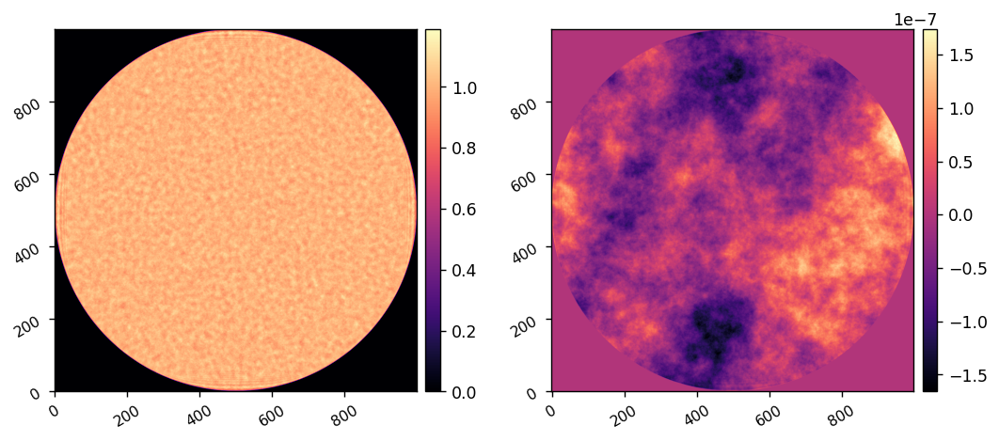

influence function sampling 31.578947368421048
Using the influence function supplied.
Including factor of 2 from reflection when computing OPD.
Using the influence function supplied.
Including factor of 2 from reflection when computing OPD.


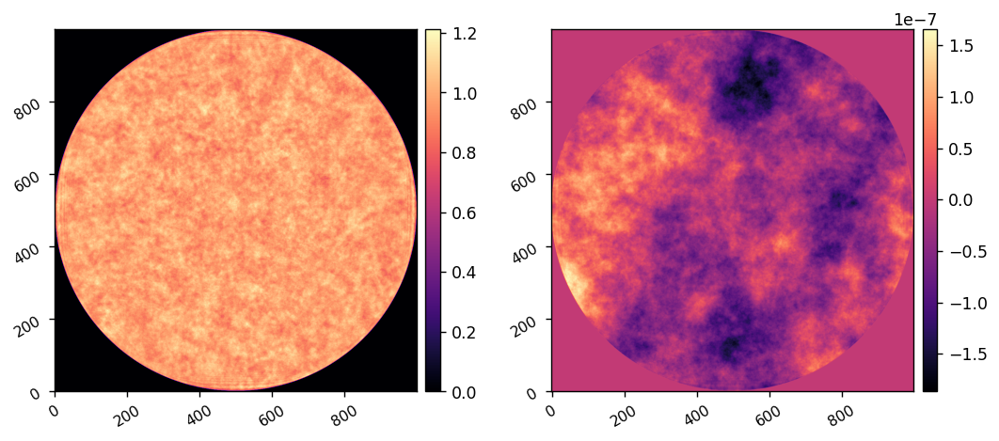

In [1]:
import numpy as np
import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload

import poppy
import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
poppy_log.disabled = True

from datetime import datetime
today = int(datetime.today().strftime('%Y%m%d'))

import warnings
warnings.filterwarnings("ignore")

import apra_pop_models
import apra_pop_models.fresnel_coro_1 as fresnel
import apra_pop_models.fraunhofer_coro_1 as fraunhofer
from apra_pop_models.math_module import xp, _scipy, ensure_np_array
import apra_pop_models.utils as utils
import apra_pop_models.efc_utils as efc_utils
import apra_pop_models.efc_2dm as efc
import apra_pop_models.pwp as pwp

from apra_pop_models.imshows import *

ote_pupil = fits.getdata('../wfe-data/telescope_wfe.fits')
imshow2(ote_pupil[0], ote_pupil[1])

model = fraunhofer.CORO()

coro_pupil = xp.array(fits.getdata('../wfe-data/coro_wfe.fits'))
coro_wfe = coro_pupil[0] * xp.exp(1j*2*np.pi*coro_pupil[1]/model.wavelength_c.to_value(u.m))
rms_amp = xp.sqrt(xp.mean(xp.square(coro_pupil[0][model.APMASK]-xp.mean(coro_pupil[0][model.APMASK]))))
rms_opd = xp.sqrt(xp.mean(xp.square(coro_pupil[1][model.APMASK])))
imshow2(coro_pupil[0], coro_pupil[1])


/home/kianmilani/Projects/apra-howfsc-models/apra_pop_models
influence function sampling 31.578947368421048
Using the influence function supplied.
Including factor of 2 from reflection when computing OPD.
Using the influence function supplied.
Including factor of 2 from reflection when computing OPD.
2048


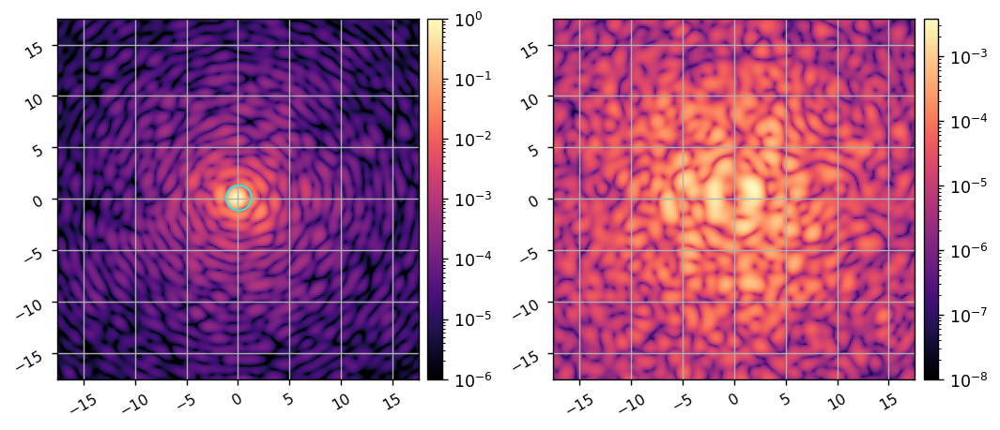

In [2]:
reload(fresnel)
coro = fresnel.CORO()
coro.WFE.amplitude = ote_pupil[0]
coro.WFE.opd = ote_pupil[1]
coro.use_opds = True

coro.npsf = 200
coro_psf = coro.snap()
coro.Imax_ref = xp.max(coro_psf)

# pup_ratio = coro.pupil_diam.to_value(u.m)/coro.dm_active_diam.to_value(u.m)
# xpp = (xp.arange(-coro.Nact//2, coro.Nact//2) + 1/2)/pup_ratio
# ppx, ppy = xp.meshgrid(xpp,xpp)
# amp = 5e-8
# separation = 5
# comm1 = amp*xp.cos(2*np.pi*(ppx + ppy)*separation/coro.Nact)*xp.array(coro.dm_mask)
# comm2 = amp*xp.cos(2*np.pi*(ppx - ppy)*separation/coro.Nact)*xp.array(coro.dm_mask)
# coro.set_dm1(ensure_np_array(comm1))
# coro.set_dm2(ensure_np_array(comm2))

coro.use_fpm = True
ref_im = coro.snap()

imshow2(coro_psf/coro.Imax_ref, ref_im, lognorm=True, vmin1=1e-6, vmin2=1e-8,
        pxscl=coro.psf_pixelscale_lamD, grid=True, 
        patches1=[Circle((coro.psf_pixelscale_lamD/2,coro.psf_pixelscale_lamD/2), 1.22, fill=False, color='cyan')])

influence function sampling 31.578947368421048
Using the influence function supplied.
Including factor of 2 from reflection when computing OPD.
Using the influence function supplied.
Including factor of 2 from reflection when computing OPD.


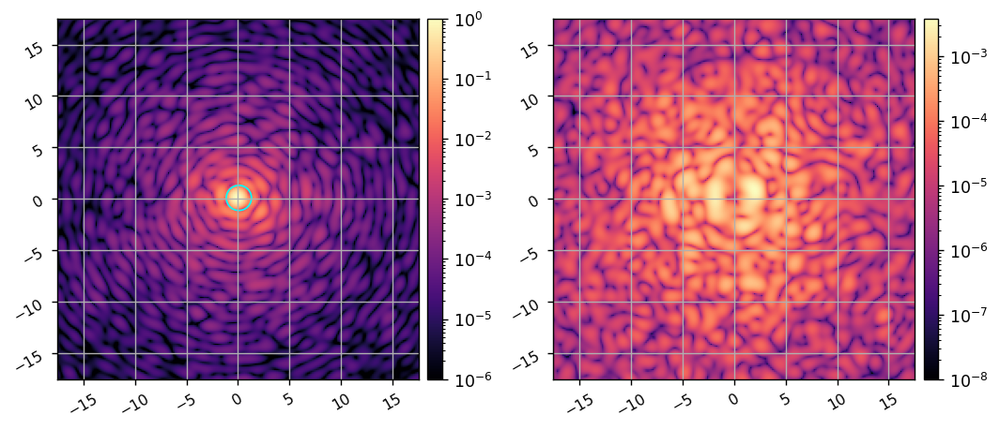

In [4]:
reload(fraunhofer)
reload(apra_pop_models.props)
model = fraunhofer.CORO()
model.npsf = 200
model.WFE = coro_wfe

model_psf = model.snap()
model.Imax_ref = xp.max(model_psf)

# pup_ratio = model.pupil_diam.to_value(u.m)/model.dm_active_diam.to_value(u.m)
# xpp = (xp.arange(-model.Nact//2, model.Nact//2) + 1/2)/pup_ratio
# ppx, ppy = xp.meshgrid(xpp,xpp)
# amp = 5e-8
# separation = 5
# comm1 = amp*xp.cos(2*np.pi*(ppx + ppy)*separation/model.Nact)*xp.array(model.dm_mask)
# comm2 = amp*xp.cos(2*np.pi*(ppx - ppy)*separation/model.Nact)*xp.array(model.dm_mask)
# model.set_dm1(ensure_np_array(comm1))
# model.set_dm2(ensure_np_array(comm2))

model.use_fpm = True
model_im = model.snap()

imshow2(model_psf/model.Imax_ref, model_im, lognorm=True, vmin1=1e-6, vmin2=1e-8,
        pxscl=model.psf_pixelscale_lamD, grid=True, 
        patches1=[Circle((model.psf_pixelscale_lamD/2,model.psf_pixelscale_lamD/2), 1.22, fill=False, color='cyan')])




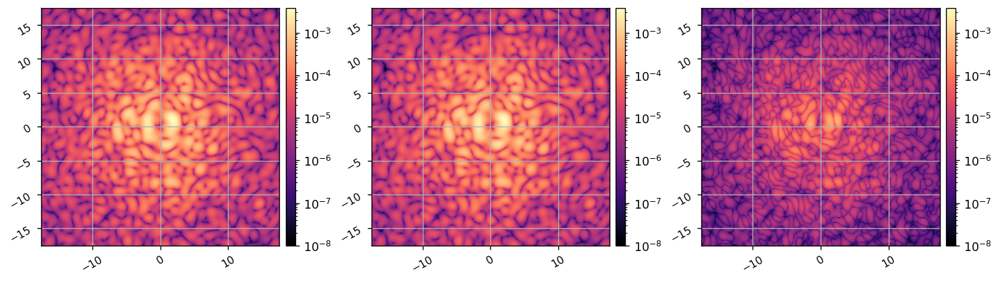

In [5]:
reload(apra_pop_models.imshows)
from apra_pop_models.imshows import *

diff = ref_im - _scipy.ndimage.shift(model_im, (0,0))
imshow3(ref_im, model_im, xp.abs(diff), 
        lognorm1=True, lognorm2=True, vmin1=1e-8, vmin2=1e-8, 
        lognorm3=True, vmin3=1e-8, vmax3=xp.max(ref_im),
        pxscl=model.psf_pixelscale_lamD, grid=True,)

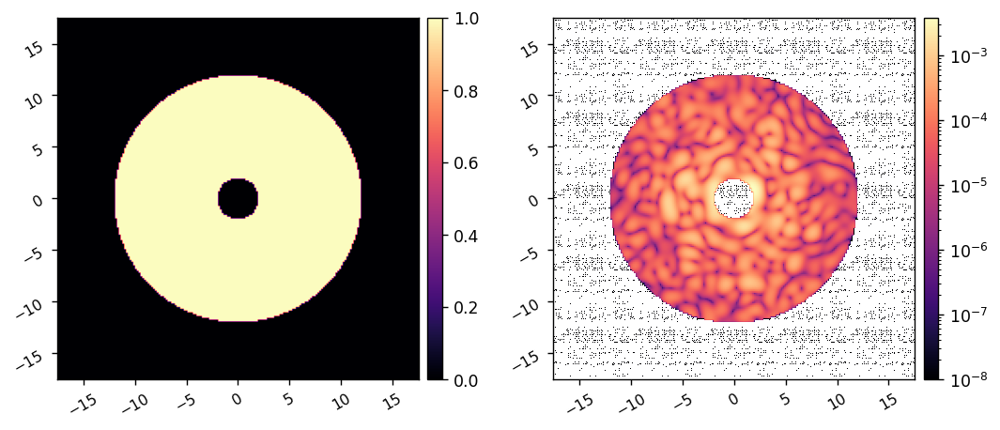

In [6]:
control_mask = efc_utils.create_annular_focal_plane_mask(model, 2, 12)
imshow2(control_mask, control_mask*ref_im, lognorm2=True, vmin2=1e-8, pxscl=model.psf_pixelscale_lamD)

In [7]:
poke_modes = efc_utils.create_all_poke_modes(model.dm_mask, ndms=2)


Calculating Jacobian: 
	Calculated response for mode 1904/1904. Elapsed time=90.853 sec.
Jacobian built in 90.853 sec


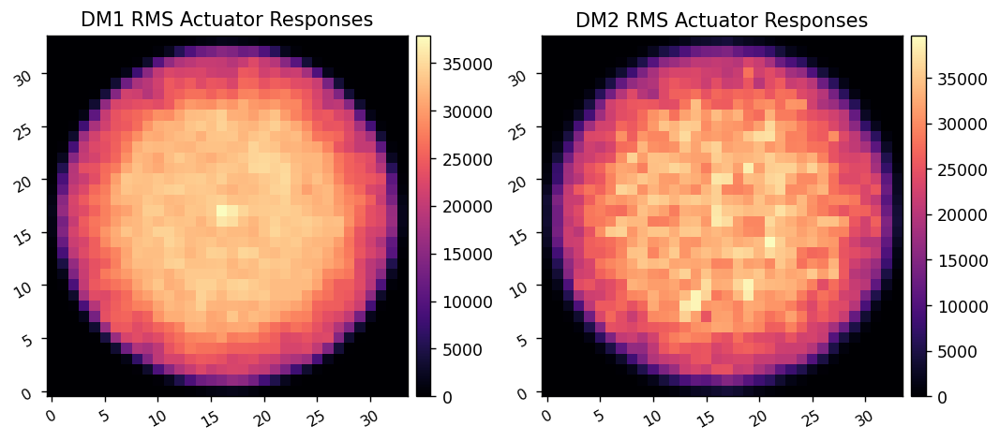

In [18]:
reload(efc)
jac = efc.build_jacobian(model, 1e-9, poke_modes, control_mask, plot_responses=True,)

# Run EFC without PWP

In [8]:
coro.reset_dms()
model.reset_dms()

images = xp.array([ref_im])
dm1_commands = xp.array([coro.get_dm1()])
dm2_commands = xp.array([coro.get_dm2()])
regs = xp.array([])

Beginning closed-loop EFC simulation.
	Running iteration 7/9.
	Mean NI of this iteration: 8.945e-07


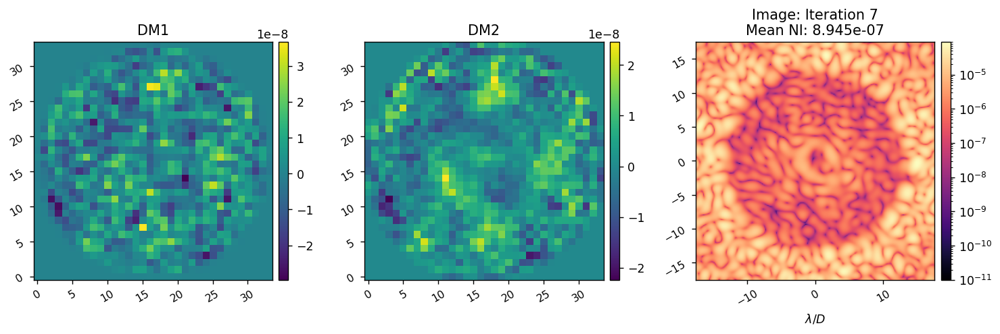

	Running iteration 8/9.
	Mean NI of this iteration: 6.222e-07


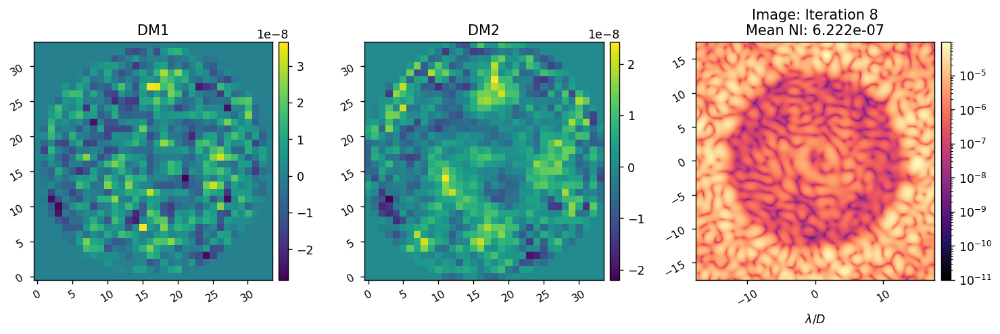

	Running iteration 9/9.
	Mean NI of this iteration: 4.415e-07


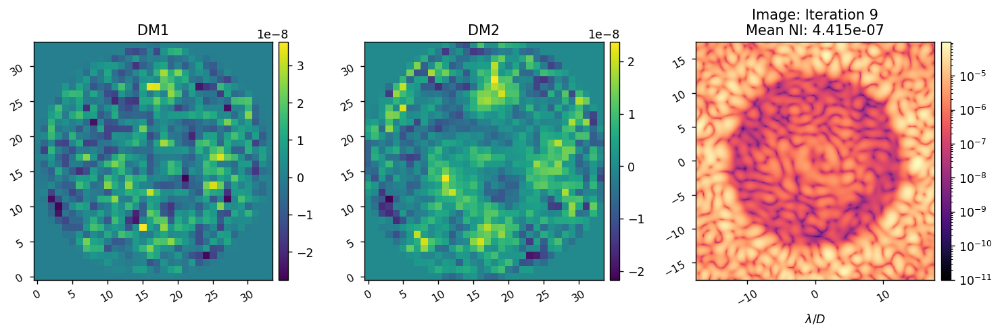

EFC completed in 6.620 sec.


In [61]:
reload(efc)

reg_fun = efc_utils.beta_reg
# reg_conds = -1
# reg_conds = -2
reg_conds = -2.5
# reg_conds = -3
# reg_conds = -3.5
# reg_conds = -4.5
# reg_conds = -5

images, dm1_commands, dm2_commands, regs = efc.run(coro, 
                                                    jac, 
                                                    reg_fun, reg_conds,
                                                    poke_modes,
                                                    control_mask, 
                                                    # est_fun=pwp_fun, est_params=pwp_params,
                                                    Imax_unocc=1,
                                                    loop_gain=0.5, 
                                                    leakage=0.0,
                                                    iterations=3, 
                                                    plot_all=True, 
                                                    # plot_sms=True,
                                                    # plot_radial_contrast=True,
                                                    old_images=images,
                                                    # old_efields=efields,
                                                    old_dm1_commands=dm1_commands,
                                                    old_dm2_commands=dm2_commands,
                                                    old_regs=regs,
                                                    )

In [55]:
regs.shape

(0,)

In [71]:
utils.save_fits('../efc-data/efc_1_with_relin_ims.fits', images)
utils.save_fits('../efc-data/efc_1_with_relin_dm1.fits', dm1_commands)
utils.save_fits('../efc-data/efc_1_with_relin_dm2.fits', dm2_commands)

Saved data to:  ../efc-data/efc_1_with_relin_ims.fits
Saved data to:  ../efc-data/efc_1_with_relin_dm1.fits
Saved data to:  ../efc-data/efc_1_with_relin_dm2.fits


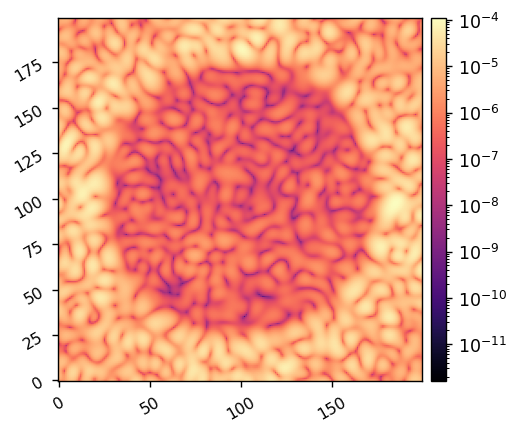

In [68]:
model.set_dm1(coro.get_dm1())
model.set_dm2(coro.get_dm2())

model_im = model.snap()
imshow1(model_im, lognorm=True)

Calculating Jacobian: 
	Calculated response for mode 1904/1904. Elapsed time=90.750 sec.
Jacobian built in 90.750 sec


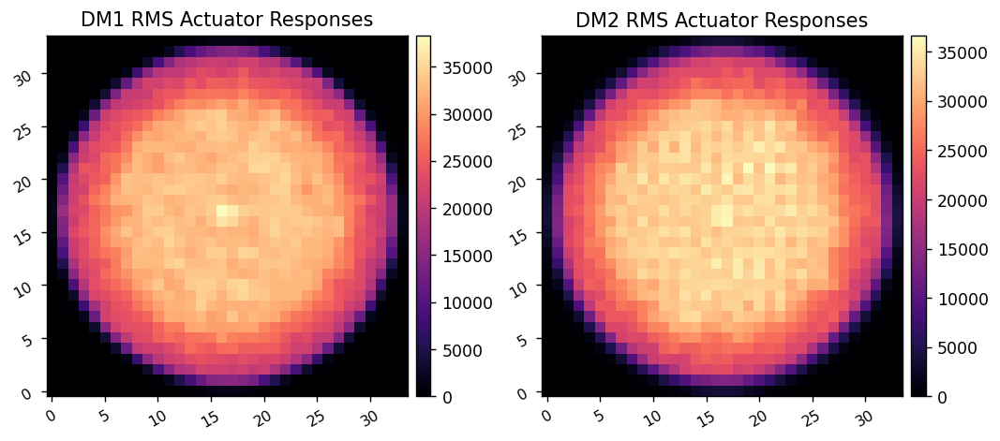

In [69]:
reload(efc)

jac_18 = efc.build_jacobian(model, 1e-9, poke_modes, control_mask, plot_responses=True,)

In [64]:
images.shape

(10, 200, 200)

Beginning closed-loop EFC simulation.
	Running iteration 19/21.
	Mean NI of this iteration: 1.565e-10


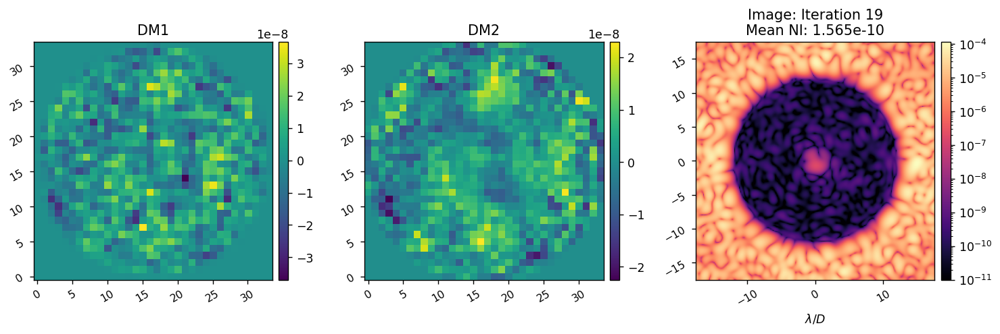

	Running iteration 20/21.
	Mean NI of this iteration: 7.259e-11


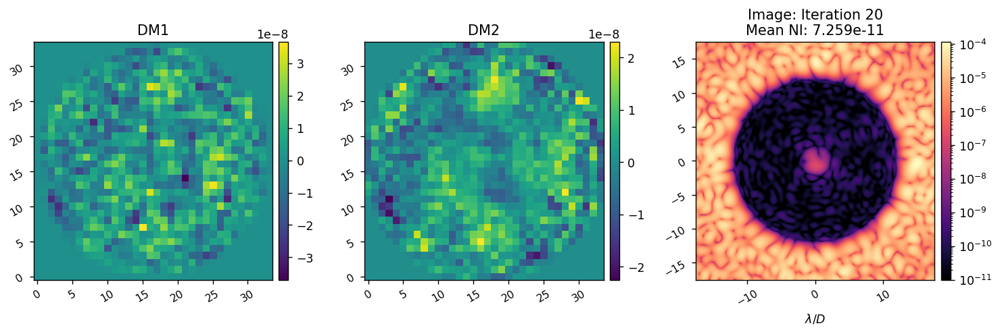

	Running iteration 21/21.
	Mean NI of this iteration: 4.700e-11


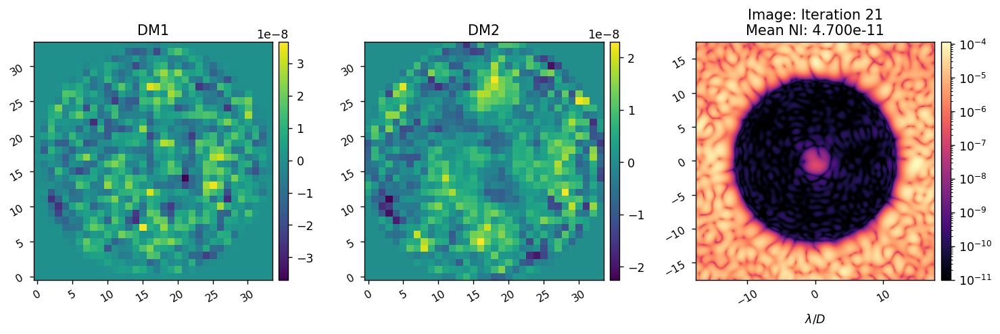

EFC completed in 5.957 sec.


In [70]:
reload(efc)

reg_fun = efc_utils.beta_reg
# reg_conds = -1
# reg_conds = -2
reg_conds = -2.5
# reg_conds = -3
# reg_conds = -3.5
# reg_conds = -4.5
# reg_conds = -5

images, dm1_commands, dm2_commands, regs = efc.run(coro, 
                                                    jac_9, 
                                                    reg_fun, reg_conds,
                                                    poke_modes,
                                                    control_mask, 
                                                    # est_fun=pwp_fun, est_params=pwp_params,
                                                    Imax_unocc=1,
                                                    loop_gain=0.5, 
                                                    leakage=0.0,
                                                    iterations=3, 
                                                    plot_all=True, 
                                                    # plot_sms=True,
                                                    # plot_radial_contrast=True,
                                                    old_images=images,
                                                    # old_efields=efields,
                                                    old_dm1_commands=dm1_commands,
                                                    old_dm2_commands=dm2_commands,
                                                    old_regs=regs,
                                                    )

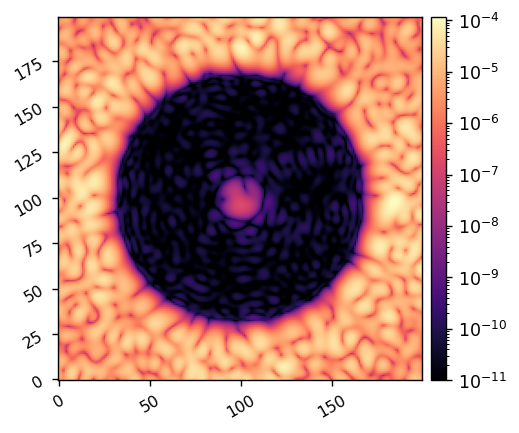

In [9]:
dm1_commands = fits.getdata('../efc-data/efc_1_with_relin_dm1.fits')
dm2_commands = fits.getdata('../efc-data/efc_1_with_relin_dm2.fits')

coro.set_dm1(dm1_commands[-1])
coro.set_dm2(dm2_commands[-1])

image = coro.snap()
imshow1(image, lognorm=True, vmin=1e-11)

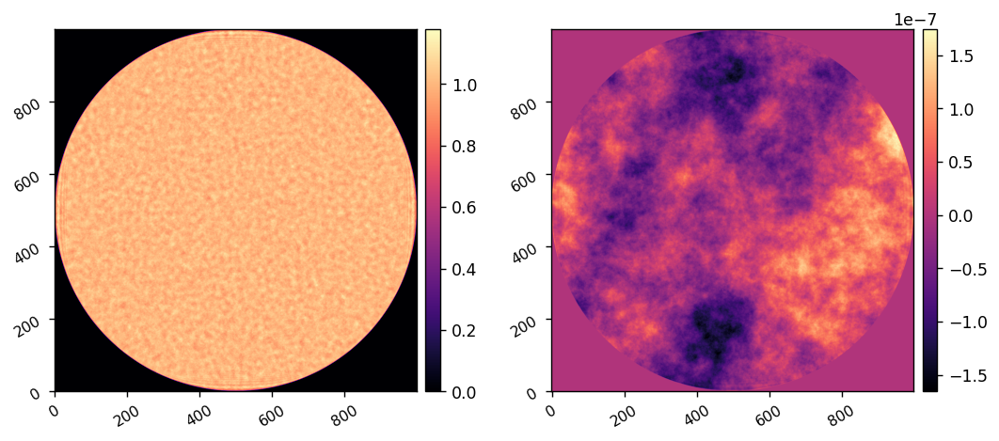

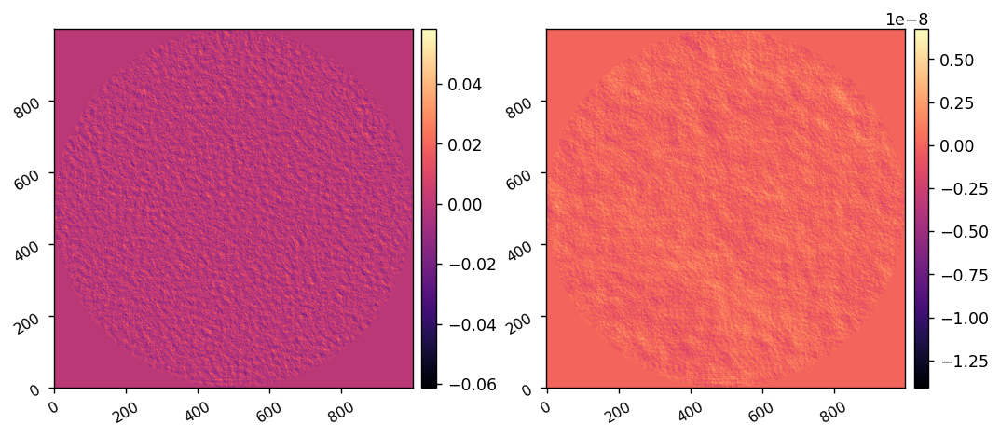

In [10]:
ote_bw_pupil = fits.getdata('../wfe-data/telescope_wfe_50mas_50mas.fits')
imshow2(ote_bw_pupil[0], ote_bw_pupil[1])
imshow2(ote_pupil[0] - ote_bw_pupil[0], ote_pupil[1] - ote_bw_pupil[1])

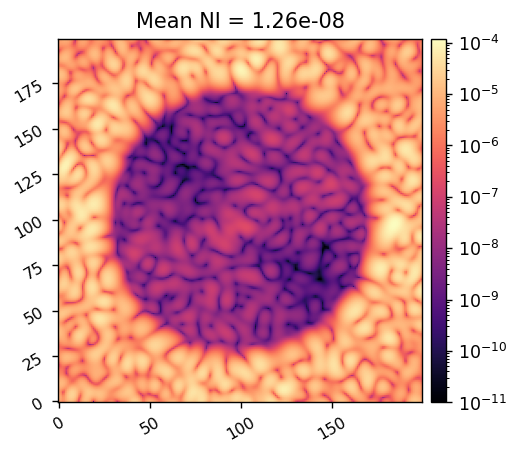

In [13]:
coro.WFE.amplitude = ote_bw_pupil[0]
coro.WFE.opd = ote_bw_pupil[1]

bw_image = coro.snap()
mean_ni = xp.mean(bw_image[control_mask])
imshow1(bw_image, f'Mean NI = {mean_ni:.2e}', lognorm=True, vmin=1e-11)

In [11]:
xp.mean(bw_image[control_mask])

array(1.26391584e-08)

# Run EFC with PWP

## Test PWP first

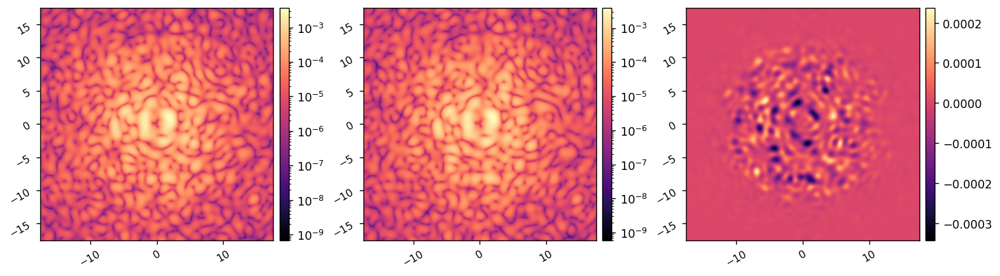

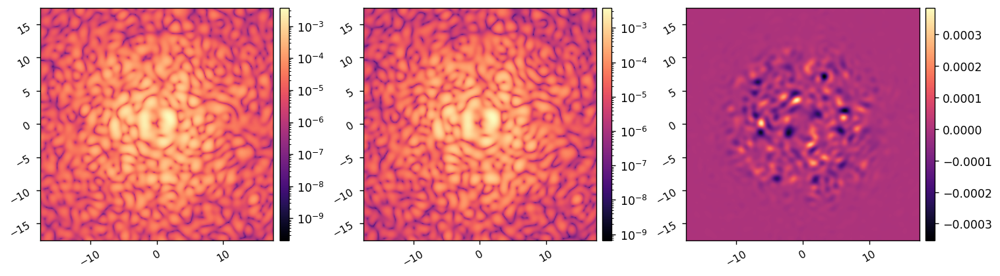

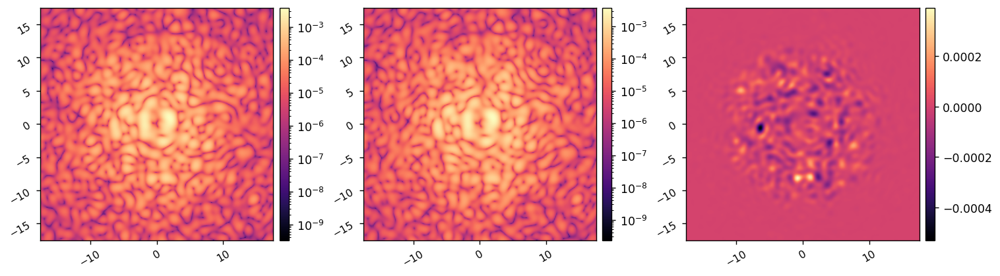

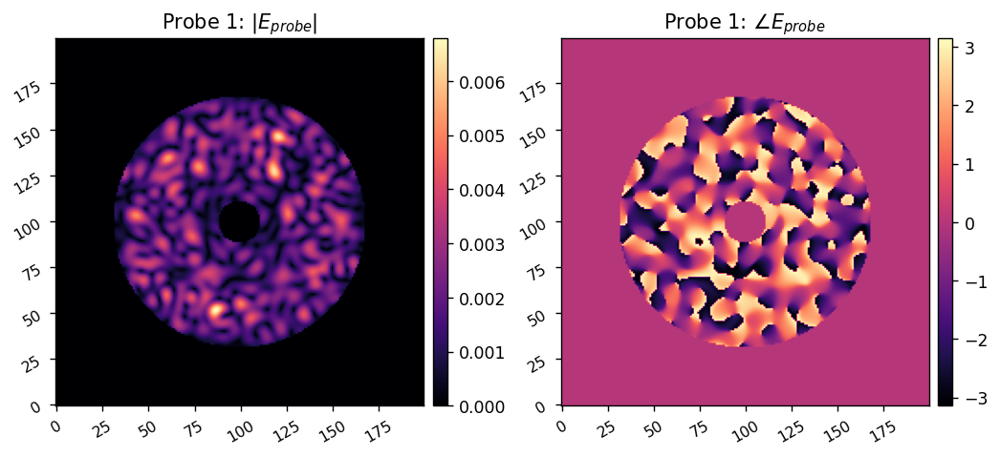

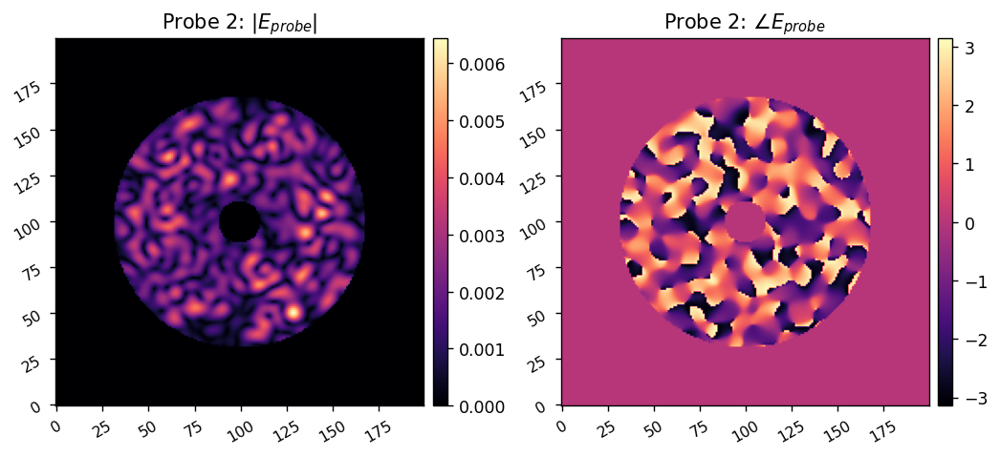

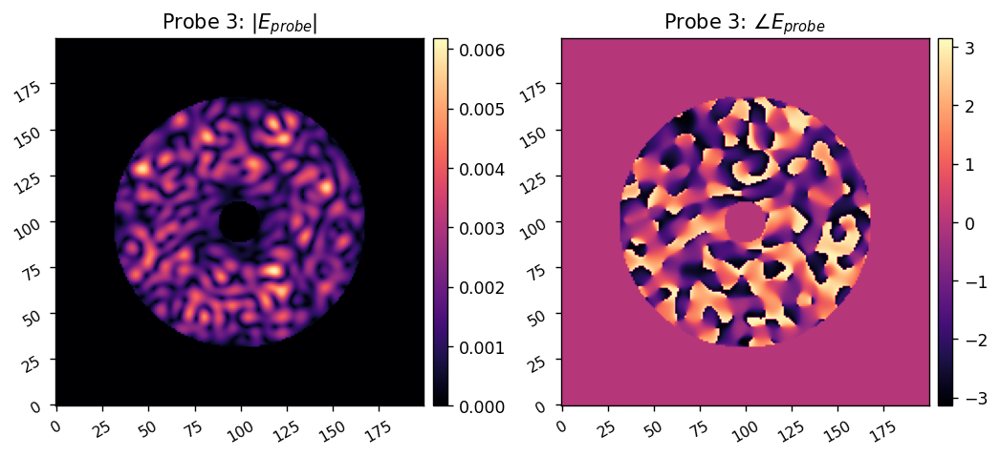

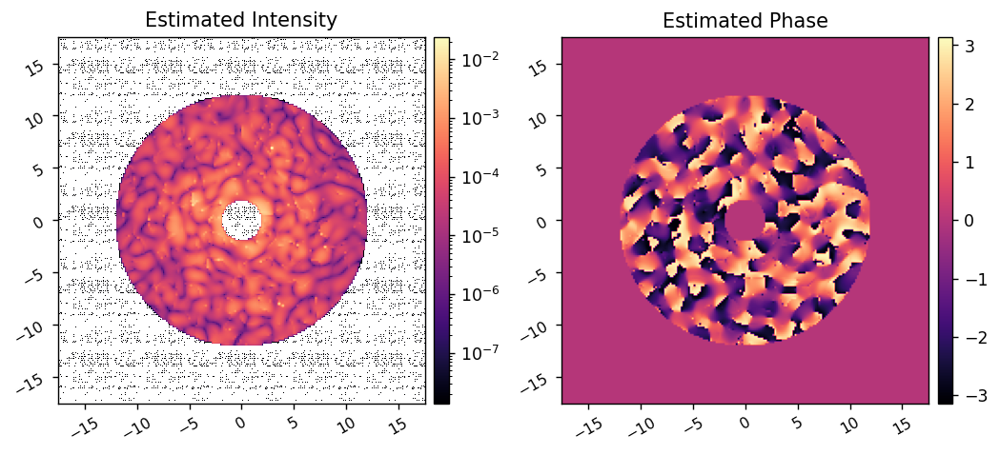

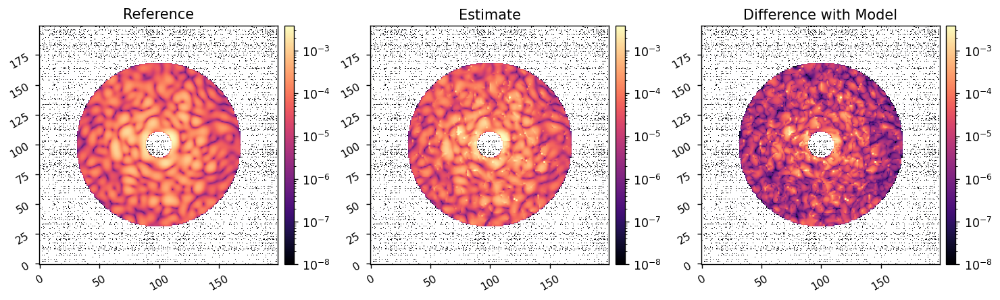

In [ ]:
reload(pwp)
coro.reset_dms()
E_est = pwp.run_pwp_bp(coro, control_mask, probes, use='J', jacobian=jac, 
                       reg_cond=1e-6,
                       plot=True,
                       plot_est=True,
                       )
I_est = np.abs(E_est)**2
P_est = np.angle(E_est)

diff = ref_im*control_mask - I_est
# vmax = xp.max(xp.concatenate([ref_im*control_mask, I_est]))
vmax = xp.max(ref_im*control_mask)
imshow3(ref_im*control_mask, I_est, xp.abs(diff),
        'Reference', 'Estimate', 'Difference with Model',
        lognorm=True, 
        vmax1=vmax, vmax2=vmax, vmax3=vmax,
        vmin1=1e-8, vmin2=1e-8, vmin3=1e-8)

# Run EFC without PWP

In [ ]:
coro.reset_dms()
model.reset_dms()

images = xp.array([ref_im])
dm1_commands = xp.array([coro.get_dm1()])
dm2_commands = xp.array([coro.get_dm2()])
regs = xp.array([])

In [18]:
coro.reset_dms()
model.reset_dms()

images = xp.array([ref_im])
dm1_commands = xp.array([coro.get_dm1()])
dm2_commands = xp.array([coro.get_dm2()])
regs = xp.array([])

Beginning closed-loop EFC simulation.
	Running iteration 19/21.


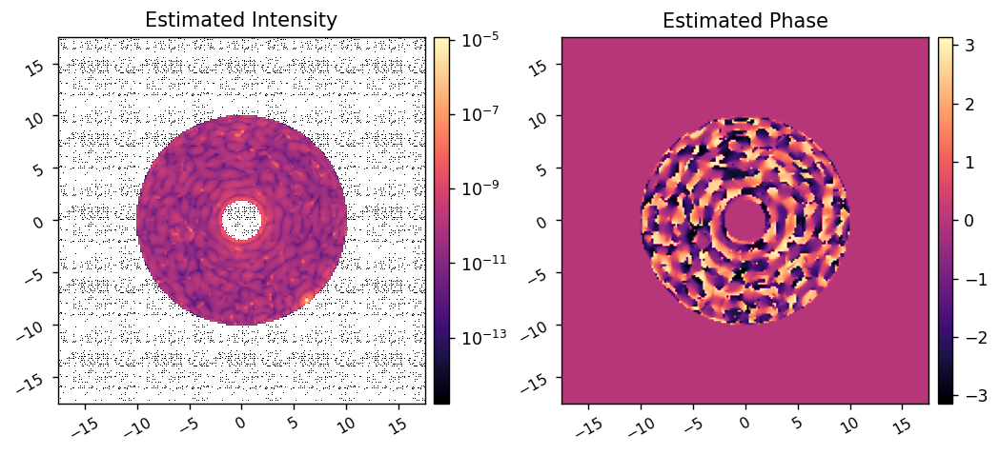

	Mean NI of this iteration: 2.056e-10


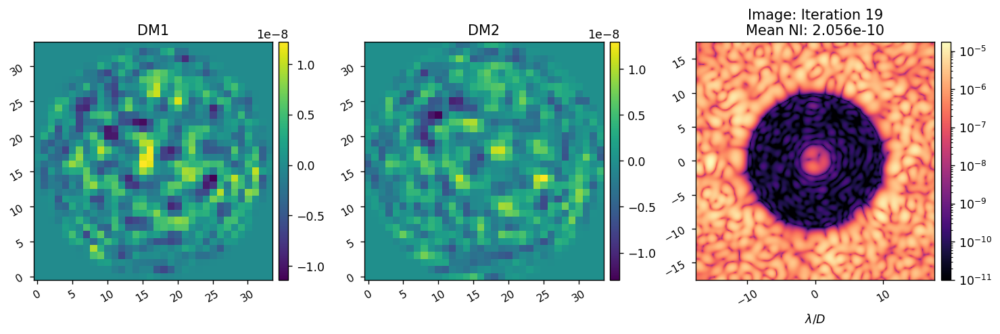

	Running iteration 20/21.


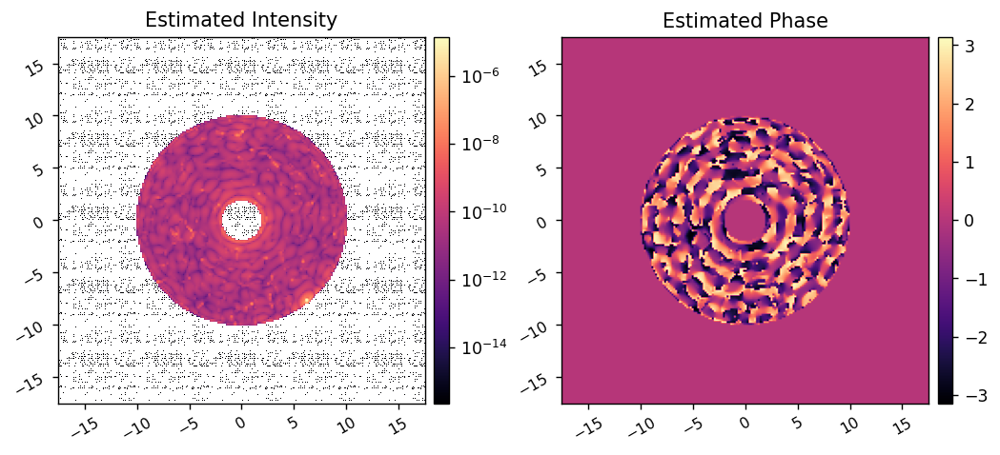

	Mean NI of this iteration: 2.152e-10


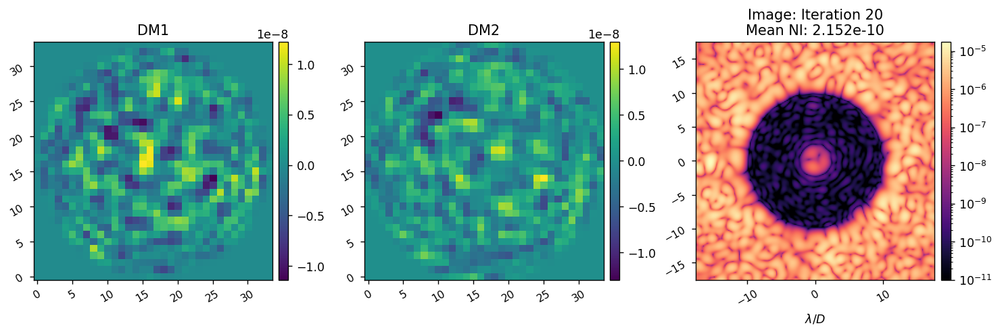

	Running iteration 21/21.


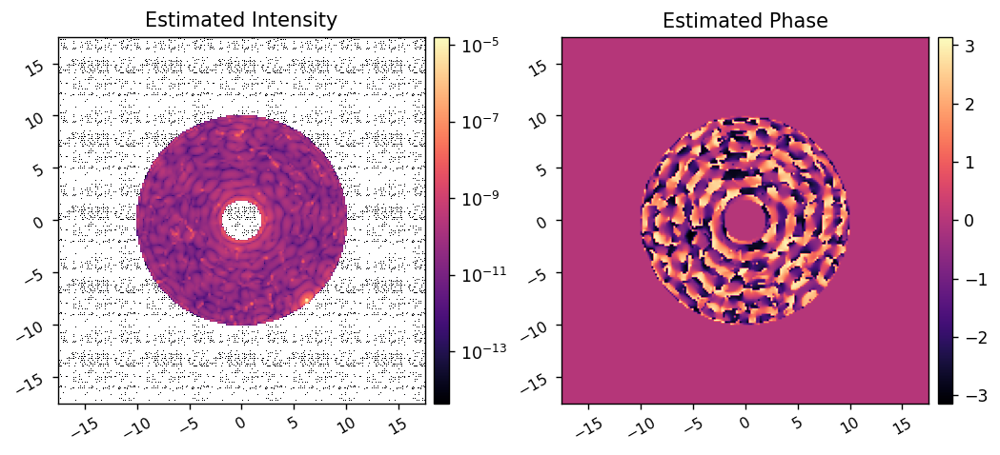

	Mean NI of this iteration: 2.298e-10


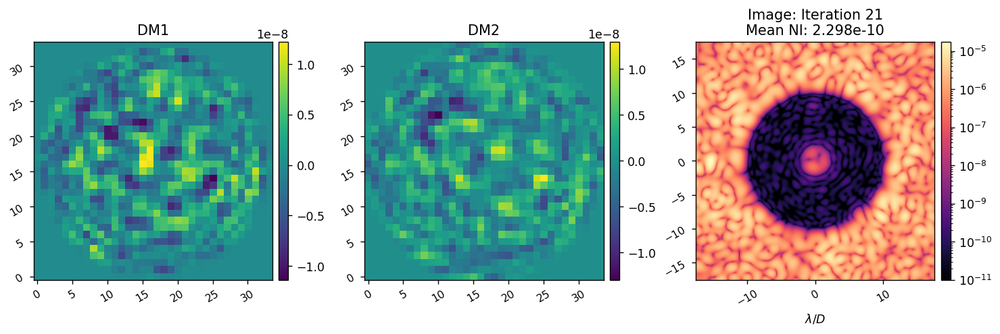

EFC completed in 32.796 sec.


In [25]:
reload(efc)

reg_fun = efc_utils.beta_reg
# reg_conds = -1
reg_conds = -2
# reg_conds = -2.5
# reg_conds = -3
# reg_conds = -3.5
# reg_conds = -4
# reg_conds = -4.5
# reg_conds = -5

pwp_fun = pwp.run_pwp_bp

pwp_reg = 1e-8
pwp_params = {
    'control_mask':control_mask,  
    'probes':probes/4,
    'use':'J', 
    'jacobian':jac,
    'reg_cond':pwp_reg, 
    'plot_est':True,
}

images, dm1_commands, dm2_commands, regs = efc.run(coro, 
                                                    jac, 
                                                    reg_fun, reg_conds,
                                                    poke_modes,
                                                    control_mask, 
                                                    est_fun=pwp_fun, est_params=pwp_params,
                                                    Imax_unocc=1,
                                                    loop_gain=0.5, 
                                                    leakage=0.0,
                                                    iterations=3, 
                                                    plot_all=True, 
                                                    # plot_sms=True,
                                                    # plot_radial_contrast=True,
                                                    old_images=images,
                                                    # old_efields=efields,
                                                    old_dm1_commands=dm1_commands,
                                                    old_dm2_commands=dm2_commands,
                                                    old_regs=regs,
                                                    )